In [43]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.preprocessing import StandardScaler

In [2]:
bank_data = pd.read_csv('bank-additional-full.csv',delimiter=';')
bank_data.shape

(41188, 21)

In [3]:
bank_data.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


In [4]:
null_counts = bank_data.isnull().sum()
null_counts

age               0
job               0
marital           0
education         0
default           0
housing           0
loan              0
contact           0
month             0
day_of_week       0
duration          0
campaign          0
pdays             0
previous          0
poutcome          0
emp.var.rate      0
cons.price.idx    0
cons.conf.idx     0
euribor3m         0
nr.employed       0
y                 0
dtype: int64

In [5]:
bank_data[['y']].value_counts()

y  
no     36548
yes     4640
Name: count, dtype: int64

In [6]:
bank_data.describe()

,age,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
count,41188.00000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000
mean,40.02406,258.285010,2.567593,962.475454,0.172963,0.081886,93.575664,-40.502600,3.621291,5167.035911
std,10.42125,259.279249,2.770014,186.910907,0.494901,1.570960,0.578840,4.628198,1.734447,72.251528
min,17.00000,0.000000,1.000000,0.000000,0.000000,-3.400000,92.201000,-50.800000,0.634000,4963.600000
25%,32.00000,102.000000,1.000000,999.000000,0.000000,-1.800000,93.075000,-42.700000,1.344000,5099.100000
50%,38.00000,180.000000,2.000000,999.000000,0.000000,1.100000,93.749000,-41.800000,4.857000,5191.000000
75%,47.00000,319.000000,3.000000,999.000000,0.000000,1.400000,93.994000,-36.400000,4.961000,5228.100000
max,98.00000,4918.000000,56.000000,999.000000,7.000000,1.400000,94.767000,-26.900000,5.045000,5228.100000


In [7]:
bank_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41188 non-null  int64  
 1   job             41188 non-null  object 
 2   marital         41188 non-null  object 
 3   education       41188 non-null  object 
 4   default         41188 non-null  object 
 5   housing         41188 non-null  object 
 6   loan            41188 non-null  object 
 7   contact         41188 non-null  object 
 8   month           41188 non-null  object 
 9   day_of_week     41188 non-null  object 
 10  duration        41188 non-null  int64  
 11  campaign        41188 non-null  int64  
 12  pdays           41188 non-null  int64  
 13  previous        41188 non-null  int64  
 14  poutcome        41188 non-null  object 
 15  emp.var.rate    41188 non-null  float64
 16  cons.price.idx  41188 non-null  float64
 17  cons.conf.idx   41188 non-null 

In [8]:
bank_data.duplicated().value_counts()

False    41176
True        12
Name: count, dtype: int64

In [9]:
bank_data = bank_data.drop_duplicates()

In [10]:
print("current data shape: ",bank_data.shape)
print("duplicate data: ", bank_data.duplicated().value_counts())

current data shape:  (41176, 21)
duplicate data:  False    41176
Name: count, dtype: int64


In [11]:
#create a new col for pdays 999 encoding for no contact

In [12]:
bank_data['contacted'] = bank_data['pdays'].apply(lambda x: 0 if x==999 else 1)

In [13]:
bank_data.tail()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y,contacted
41183,73,retired,married,professional.course,no,yes,no,cellular,nov,fri,...,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,yes,0
41184,46,blue-collar,married,professional.course,no,no,no,cellular,nov,fri,...,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,no,0
41185,56,retired,married,university.degree,no,yes,no,cellular,nov,fri,...,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,no,0
41186,44,technician,married,professional.course,no,no,no,cellular,nov,fri,...,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,yes,0
41187,74,retired,married,professional.course,no,yes,no,cellular,nov,fri,...,999,1,failure,-1.1,94.767,-50.8,1.028,4963.6,no,0


In [14]:
bank_data = bank_data.replace(to_replace=['yes','no'],value=[1,0])
bank_data

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y,contacted
0,56,housemaid,married,basic.4y,0,0,0,telephone,may,mon,...,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,0,0
1,57,services,married,high.school,unknown,0,0,telephone,may,mon,...,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,0,0
2,37,services,married,high.school,0,1,0,telephone,may,mon,...,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,0,0
3,40,admin.,married,basic.6y,0,0,0,telephone,may,mon,...,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,0,0
4,56,services,married,high.school,0,0,1,telephone,may,mon,...,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41183,73,retired,married,professional.course,0,1,0,cellular,nov,fri,...,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,1,0
41184,46,blue-collar,married,professional.course,0,0,0,cellular,nov,fri,...,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,0,0
41185,56,retired,married,university.degree,0,1,0,cellular,nov,fri,...,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,0,0
41186,44,technician,married,professional.course,0,0,0,cellular,nov,fri,...,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,1,0


In [15]:
bank_data['contact'] = bank_data['contact'].map({'cellular': 1, 'telephone': 0})

In [16]:
bank_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 41176 entries, 0 to 41187
Data columns (total 22 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41176 non-null  int64  
 1   job             41176 non-null  object 
 2   marital         41176 non-null  object 
 3   education       41176 non-null  object 
 4   default         41176 non-null  object 
 5   housing         41176 non-null  object 
 6   loan            41176 non-null  object 
 7   contact         41176 non-null  int64  
 8   month           41176 non-null  object 
 9   day_of_week     41176 non-null  object 
 10  duration        41176 non-null  int64  
 11  campaign        41176 non-null  int64  
 12  pdays           41176 non-null  int64  
 13  previous        41176 non-null  int64  
 14  poutcome        41176 non-null  object 
 15  emp.var.rate    41176 non-null  float64
 16  cons.price.idx  41176 non-null  float64
 17  cons.conf.idx   41176 non-null  floa

In [17]:
bank_data[['job']].value_counts()

job          
admin.           10419
blue-collar       9253
technician        6739
services          3967
management        2924
retired           1718
entrepreneur      1456
self-employed     1421
housemaid         1060
unemployed        1014
student            875
unknown            330
Name: count, dtype: int64

In [18]:
bank_data[['marital']].value_counts()

marital 
married     24921
single      11564
divorced     4611
unknown        80
Name: count, dtype: int64

In [19]:
bank_data[['education']].value_counts()

education          
university.degree      12164
high.school             9512
basic.9y                6045
professional.course     5240
basic.4y                4176
basic.6y                2291
unknown                 1730
illiterate                18
Name: count, dtype: int64

In [20]:
bank_data[['loan']].value_counts()

loan   
0          33938
1           6248
unknown      990
Name: count, dtype: int64

In [21]:
features_with_unknown = ['job','marital','education','default','housing','loan']
features_without_unknown = ['month','day_of_week','poutcome']

#do one hot encoding for categorical features

dummies_without_unknown = pd.get_dummies(bank_data[features_without_unknown],drop_first=True)
dummies_with_unknown = pd.get_dummies(bank_data[features_with_unknown])

#bank_data = pd.concat([bank_data,dummies], axis=1)

In [22]:
dummies_with_unknown.info()

<class 'pandas.core.frame.DataFrame'>
Index: 41176 entries, 0 to 41187
Data columns (total 33 columns):
 #   Column                         Non-Null Count  Dtype
---  ------                         --------------  -----
 0   job_admin.                     41176 non-null  bool 
 1   job_blue-collar                41176 non-null  bool 
 2   job_entrepreneur               41176 non-null  bool 
 3   job_housemaid                  41176 non-null  bool 
 4   job_management                 41176 non-null  bool 
 5   job_retired                    41176 non-null  bool 
 6   job_self-employed              41176 non-null  bool 
 7   job_services                   41176 non-null  bool 
 8   job_student                    41176 non-null  bool 
 9   job_technician                 41176 non-null  bool 
 10  job_unemployed                 41176 non-null  bool 
 11  job_unknown                    41176 non-null  bool 
 12  marital_divorced               41176 non-null  bool 
 13  marital_married      

In [23]:
#drop the unknown cols from data
unknown_cols_one_hot = ['job_unknown','marital_unknown','education_unknown','default_unknown','housing_unknown','loan_unknown']

dummies_with_unknown = dummies_with_unknown.drop(unknown_cols_one_hot,axis=1)

In [24]:
dummies_with_unknown.info()

<class 'pandas.core.frame.DataFrame'>
Index: 41176 entries, 0 to 41187
Data columns (total 27 columns):
 #   Column                         Non-Null Count  Dtype
---  ------                         --------------  -----
 0   job_admin.                     41176 non-null  bool 
 1   job_blue-collar                41176 non-null  bool 
 2   job_entrepreneur               41176 non-null  bool 
 3   job_housemaid                  41176 non-null  bool 
 4   job_management                 41176 non-null  bool 
 5   job_retired                    41176 non-null  bool 
 6   job_self-employed              41176 non-null  bool 
 7   job_services                   41176 non-null  bool 
 8   job_student                    41176 non-null  bool 
 9   job_technician                 41176 non-null  bool 
 10  job_unemployed                 41176 non-null  bool 
 11  marital_divorced               41176 non-null  bool 
 12  marital_married                41176 non-null  bool 
 13  marital_single       

In [25]:
# add the one hot cols back to main data

bank_data = pd.concat([bank_data,dummies_with_unknown], axis=1)

In [26]:
bank_data = pd.concat([bank_data,dummies_without_unknown], axis=1)

In [27]:
original_columns_to_drop = ['job','marital','education','default','housing','loan','month','day_of_week','poutcome']
bank_data = bank_data.drop(columns=original_columns_to_drop,axis=1)

In [28]:
bank_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 41176 entries, 0 to 41187
Data columns (total 55 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   age                            41176 non-null  int64  
 1   contact                        41176 non-null  int64  
 2   duration                       41176 non-null  int64  
 3   campaign                       41176 non-null  int64  
 4   pdays                          41176 non-null  int64  
 5   previous                       41176 non-null  int64  
 6   emp.var.rate                   41176 non-null  float64
 7   cons.price.idx                 41176 non-null  float64
 8   cons.conf.idx                  41176 non-null  float64
 9   euribor3m                      41176 non-null  float64
 10  nr.employed                    41176 non-null  float64
 11  y                              41176 non-null  int64  
 12  contacted                      41176 non-null  int6

In [29]:
bank_data.head()

,age,contact,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,...,month_may,month_nov,month_oct,month_sep,day_of_week_mon,day_of_week_thu,day_of_week_tue,day_of_week_wed,poutcome_nonexistent,poutcome_success
0,56,0,261,1,999,0,1.1,93.994,-36.4,4.857,...,True,False,False,False,True,False,False,False,True,False
1,57,0,149,1,999,0,1.1,93.994,-36.4,4.857,...,True,False,False,False,True,False,False,False,True,False
2,37,0,226,1,999,0,1.1,93.994,-36.4,4.857,...,True,False,False,False,True,False,False,False,True,False
3,40,0,151,1,999,0,1.1,93.994,-36.4,4.857,...,True,False,False,False,True,False,False,False,True,False
4,56,0,307,1,999,0,1.1,93.994,-36.4,4.857,...,True,False,False,False,True,False,False,False,True,False


## **Split** **data**

In [36]:
from sklearn.model_selection import train_test_split

x = bank_data.drop(['y'], axis=1)
y = bank_data['y']

In [32]:
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.3,random_state=42)

In [ ]:
rf_model = RandomForestClassifier(random_state=42)

In [38]:
#perform grid search to find best params

from sklearn.model_selection import GridSearchCV

param_grid = {
    'criterion': ['gini','entropy'],
    'n_estimators': [50,100,200],
    'max_depth': [5,10,15],
    'min_samples_split': [2,5,10],
    'min_samples_leaf': [1,2,5]
}

grid_search = GridSearchCV(estimator=rf_model,param_grid=param_grid,cv=5,n_jobs=-1,verbose=2)
grid_search.fit(x_train,y_train)
grid_search.best_score_

Fitting 5 folds for each of 162 candidates, totalling 810 fits


0.9143043672692845

In [39]:
grid_search.best_params_

{'criterion': 'gini',
 'max_depth': 15,
 'min_samples_leaf': 2,
 'min_samples_split': 10,
 'n_estimators': 50}

In [42]:
clf = RandomForestClassifier(criterion='gini',max_depth=15,min_samples_leaf=2,min_samples_split=10,n_estimators=50,random_state=0)
clf.fit(x_train,y_train)
y_pred = clf.predict(x_test)
print("accuracy",accuracy_score(y_test,y_pred))

accuracy 0.9109528049866429


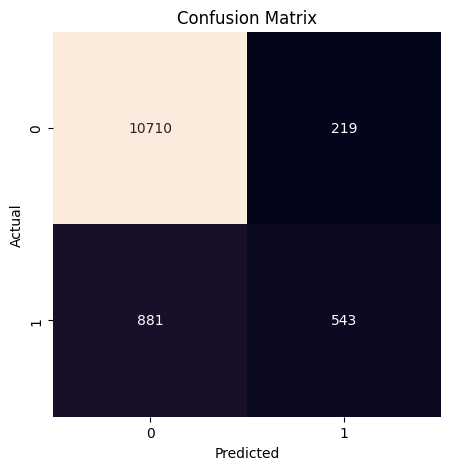

In [47]:
#confusion matrix heatmap

cm = confusion_matrix(y_test,y_pred)
plt.figure(figsize=(5, 5))
sns.heatmap(cm, annot=True, fmt='d', cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

In [37]:
#show graph

from IPython.display import Image
from io import StringIO
from sklearn.tree import export_graphviz
import pydotplus, graphviz

def show_dt_graph(dt):
  dot_data = StringIO()
  export_graphviz(dt.estimators_[0], out_file=dot_data, filled = True, feature_names=x_train.columns, rounded=False, class_names=['Bought FD', 'Did not buy FD'])
  graph = pydotplus.graph_from_dot_data(dot_data.getvalue())


  return Image(graph.create_png())

In [ ]:
show_dt_graph(clf)

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.511257 to fit



In [48]:
feature_importances = clf.feature_importances_

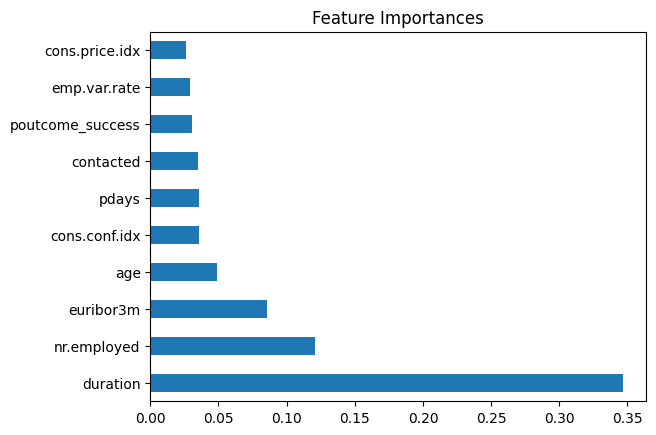

In [52]:
#plot top ten feature importances

feature_importances = pd.Series(clf.feature_importances_, index=x_train.columns)
feature_importances.nlargest(10).plot(kind='barh')
plt.title("Feature Importances")
plt.show()
